### Introduction

**About the project:**

The objective of this project is to develop a basic PPE detection system using computer vision, machine learning, and image/video processing tools to ensure meticulous adherence to Personal Protective Equipment (PPE) protocols in various industrial settings. PPE is essential for safeguarding workers and individuals from physical injuries, chemical exposures, and infectious diseases. The objective is to create a basic but versatile solution that enhances safety and regulatory compliance across various industries and scale or customize this solution to fit different purposes.

The primary objective of this project is to create a robust and versatile PPE detection system using computer vision, and image/video processing tools. This system will ensure strict adherence to PPE protocols in various industrial settings. PPE, including helmets, gloves, and vests, is indispensable for safeguarding workers and individuals from physical injuries, chemical exposures, and infectious diseases.




**Author(s):**

Shas Vaddi

### **I. Business Understanding**

The project aims to develop a basic but effective solution that enhances safety and regulatory compliance across various industries while providing flexibility to adapt and customize the solution for different purposes including,

**Worker Safety**

The foremost driver behind this project is the commitment to worker safety. Ensuring that employees and individuals in industrial settings wear the appropriate PPE significantly reduces the risk of accidents, injuries, and exposure to hazardous substances, leading to a safer work environment and reduced workplace incidents.

**Regulatory Compliance**

Many industries are subject to strict regulations and standards regarding PPE usage. Non-compliance can result in fines, legal consequences, and reputational damage. By developing a PPE detection system, the business aims to assist organizations in meeting and exceeding these compliance requirements.

**Cost Savings**

Workplace accidents and injuries can lead to significant financial costs for organizations, including medical expenses, insurance claims, and worker compensation. By preventing such incidents through effective PPE detection, the project can contribute to business cost savings.

**Customization and Scalability**

The project's versatility allows it to be customized and scaled to fit different industries and use cases. This adaptability is a key business driver, opening opportunities for broader market adoption and revenue generation.

**Data-Driven Insights**

The PPE detection system can provide valuable data and insights into PPE compliance trends and areas of improvement within an organization. This data-driven approach can support informed decision-making and enhance overall workplace safety.


In [1]:
#@title Install Pre-req's
%%capture
import warnings
warnings.filterwarnings("ignore")
!pip install super-gradients
!pip install super-gradients imutils pytube --upgrade


In [2]:
#@title Import all required libraries
%%capture
from IPython.display import HTML
from base64 import b64encode
from google.colab import drive
from super_gradients.training import Trainer, dataloaders, models
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val
from super_gradients.common.object_names import Models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
import torch
import os

In [3]:
#@title Assign Experiment name and Best model checkpoint
trainer = Trainer(experiment_name='ppe_yolonas_pipeline', ckpt_root_dir='checkpoints')

In [4]:
#@title  Mount Google Drive
# Mount the drive
drive.mount('/content/drive')

Mounted at /content/drive


### **II. EDA and Pre-Processing**

In developing a deep learning-based PPE detection system, we prepare our data meticulously through a series of crucial steps, including Exploratory Data Analysis (EDA) and data pre-processing. These steps ensure we are fully prepared to effectively apply powerful deep learning models. The data preparation journey involves structuring our dataset, normalizing and augmenting our data, relying on raw image features, and ensuring that our images are well-prepared for the rigorous demands of deep learning. This meticulous process sets the stage for our deep learning models to excel in recognizing and classifying Personal Protective Equipment, ultimately contributing to enhanced workplace safety and regulatory compliance.

We structure our dataset into three fundamental sets: training, validation, and test sets. This separation allows us to train our deep learning models on one portion of the data, validate their performance on another, and ultimately test their real-world capabilities on a completely independent dataset. This practice is a cornerstone of deep learning model development.

When it comes to data pre-processing, we must address several critical aspects. First and foremost, we need to normalize our data. It ensures that all our input data, in this case, images, is in a consistent format and scale, facilitating the learning process. However, deep learning often demands more than just normalized data. It requires data augmentation, a technique used to increase the training dataset's diversity artificially. Our code explicitly applies data augmentation through a transformation called DetectionRandomAffine. This transformation randomly applies various affine transformations to our training data, such as rotations by up to 10 degrees. These variations help our deep learning model become more robust, ensuring that it can handle different angles and positions of objects, like Personal Protective Equipment (PPE) items, in real-world scenarios.

Deep learning models excel at automatically learning relevant features from raw data. In this context, the raw features are the pixel values of the images themselves. The deep neural network will learn to extract essential features from these images during training, allowing it to effectively recognize and classify PPE items. Lastly, while focusing primarily on image data in this project, we must ensure that these images are appropriately loaded, transformed, and prepared for later AI computation. All these steps, from data normalization to augmentation, ensure that our deep learning model can perform PPE detection accurately and reliably.


In [5]:
#@title Load dataset Props

dataset_params = {
    'data_dir':'/content/drive/MyDrive/PPEDetection/PPE_Detection',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['Dust Mask', 'Eye Wear', 'Glove', 'Protective Boots', 'Protective Helmet', 'Safety Vest', 'Shield']
}

In [6]:
#@title Quick check on how to use the function
help(coco_detection_yolo_format_train)


Help on function coco_detection_yolo_format_train in module super_gradients.training.dataloaders.dataloaders:

coco_detection_yolo_format_train(dataset_params: Dict = None, dataloader_params: Dict = None) -> torch.utils.data.dataloader.DataLoader



In [7]:
#@title Assign the split data to train, val and test
train_data = coco_detection_yolo_format_train(
    dataset_params={ 'data_dir': dataset_params['data_dir'], 'images_dir': dataset_params['train_images_dir'], 'labels_dir': dataset_params['train_labels_dir'], 'classes': dataset_params['classes'] },
    dataloader_params={ 'batch_size':16,'num_workers':4 } )

val_data = coco_detection_yolo_format_val(dataset_params={'data_dir': dataset_params['data_dir'],'images_dir': dataset_params['val_images_dir'],'labels_dir': dataset_params['val_labels_dir'], 'classes': dataset_params['classes'] },
                                          dataloader_params={'batch_size':16,'num_workers':4})

test_data = coco_detection_yolo_format_val(dataset_params={ 'data_dir': dataset_params['data_dir'], 'images_dir': dataset_params['test_images_dir'], 'labels_dir': dataset_params['test_labels_dir'], 'classes': dataset_params['classes'] },
                                           dataloader_params={ 'batch_size':16,'num_workers':4 })



Indexing dataset annotations: 100%|██████████| 322/322 [03:55<00:00,  1.37it/s]


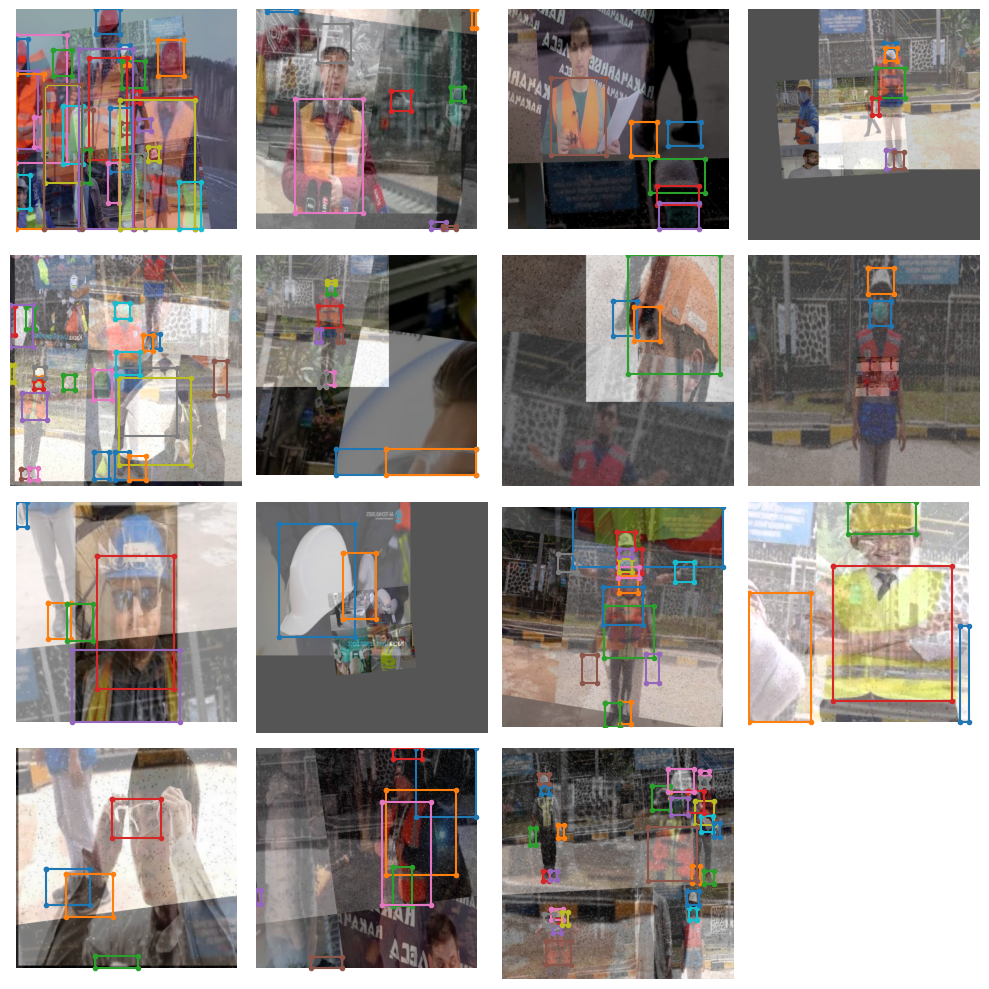

In [8]:
# Update transformations for the train data loader
train_data.dataset.transforms
train_data.dataset.dataset_params['transforms'][1]
train_data.dataset.dataset_params['transforms'][1]['DetectionRandomAffine']['degrees'] = 10
train_data.dataset.plot(15)

### **III. Modeling Methods, Validation, and Performance Metrics**

In developing an adequate PPE (Personal Protective Equipment) detection system using deep learning, we reach a critical phase: modeling methods, validation, and performance metrics. These aspects are pivotal in ensuring that our system functions well and aligns with our project objectives.

**Modeling Methods**

We start by creating an instance of the model named 'yolo_nas_s.' which is designed for object detection and is a perfect fit for identifying PPE items. Importantly, we initialize this model with pre-trained weights from the COCO dataset. Leveraging knowledge from a vast dataset like COCO can significantly boost our model's performance on the PPE detection task.

**Validation**

To ensure our model is robust and accurate, we must train it diligently. The code illustrates this training process using a Trainer instance. We configure several training parameters, including learning rate scheduling, optimization using Adam with weight decay, mixed precision training for efficiency, and even early stopping based on validation metrics. The model is set to train for a maximum of 10 epochs, although it can converge earlier if it performs well.

**Performance Metrics**

Measuring our model's performance is paramount. We've carefully selected performance metrics tailored to our PPE detection objectives. The star metric here is the Mean Average Precision (mAP) at an Intersection over Union (IoU) threshold of 0.50. Why mAP@0.50? Because it's a highly relevant metric for object detection tasks like ours. We use the DetectionMetrics_050 class during validation to compute this metric with specific settings, including score thresholding, non-maximum suppression (NMS), and other parameters to ensure precise evaluation.

After training, we load the best-performing model using a checkpoint, and here's where the rubber meets the road: evaluation of the test dataset. Again, we employ the mAP@0.50 metric with similar settings to assess how well our model can detect PPE items in unseen data. Instead of cross-validation, we've opted for a held-out test set approach, separating a dedicated test dataset from our training data. While cross-validation involves multiple iterations of training and testing on different data subsets, we're testing our model's generalization on this separate test set. It's a common practice in deep learning when the dataset is sufficiently large.


In [9]:
#@title Create an Instance of the model for finetuning and Train the model

model = models.get('yolo_nas_s', num_classes=len(dataset_params['classes']), pretrained_weights="coco")

Downloading: "https://sghub.deci.ai/models/yolo_nas_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth
100%|██████████| 73.1M/73.1M [00:05<00:00, 13.1MB/s]


In [10]:
# Create Train Parameters

train_params = {
    # Training settings
    "max_epochs": 10,
    "mixed_precision": True,

    # Warmup settings
    "warmup_mode": "LinearEpochLRWarmup",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,

    # Learning rate settings
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,

    # Optimizer settings
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,

    # Exponential Moving Average (EMA) settings
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},

    # Loss function
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),

    # Validation metrics
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],

    # Model saving and monitoring
    "silent_mode": True,
    "average_best_models": True,
    "metric_to_watch": 'mAP@0.50'
}

In [11]:
#@title Train the model
trainer.train(model=model, training_params=train_params, train_loader=train_data, valid_loader=val_data)

[2023-12-12 00:51:51] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-12-12 00:51:59] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            2271       (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         141        (len(train_loader))
    - Gradient updates per epoch:   141        (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_S  (19.02M parameters, 19.02M optimized)
    - Learning Rates and Weight Decays:
      - default: (19.02M parameters). LR: 0.0005 (19.02M parameters) WD: 0.0, (42.15K para

In [12]:
#@title Evaluate the model


# Load the best performing model
best_model_checkpoint = "/content/checkpoints/ppe_yolonas_pipeline/RUN_20231212_005151_402513/ckpt_best.pth"
best_model = models.get('yolo_nas_s', num_classes=len(dataset_params['classes']), checkpoint_path=best_model_checkpoint)


test_metrics = DetectionMetrics_050(
    score_thres=0.1,
    top_k_predictions=300,
    num_cls=len(dataset_params['classes']),
    normalize_targets=True,
    post_prediction_callback=PPYoloEPostPredictionCallback(
        score_threshold=0.01,
        nms_top_k=1000,
        max_predictions=300,
        nms_threshold=0.7
    )
)

trainer.test(model=best_model, test_loader=test_data, test_metrics_list=test_metrics)

[2023-12-12 01:34:21] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/ppe_yolonas_pipeline/RUN_20231212_005151_402513/ckpt_best.pth EMA checkpoint.
Testing: 100%|██████████| 21/21 [00:13<00:00,  1.57it/s]


{'PPYoloELoss/loss_cls': 0.81317604,
 'PPYoloELoss/loss_iou': 0.41225618,
 'PPYoloELoss/loss_dfl': 0.44994822,
 'PPYoloELoss/loss': 1.6753803,
 'Precision@0.50': 0.06701880693435669,
 'Recall@0.50': 0.9768519997596741,
 'mAP@0.50': 0.802329957485199,
 'F1@0.50': 0.12173935025930405}

[2023-12-12 01:34:43] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


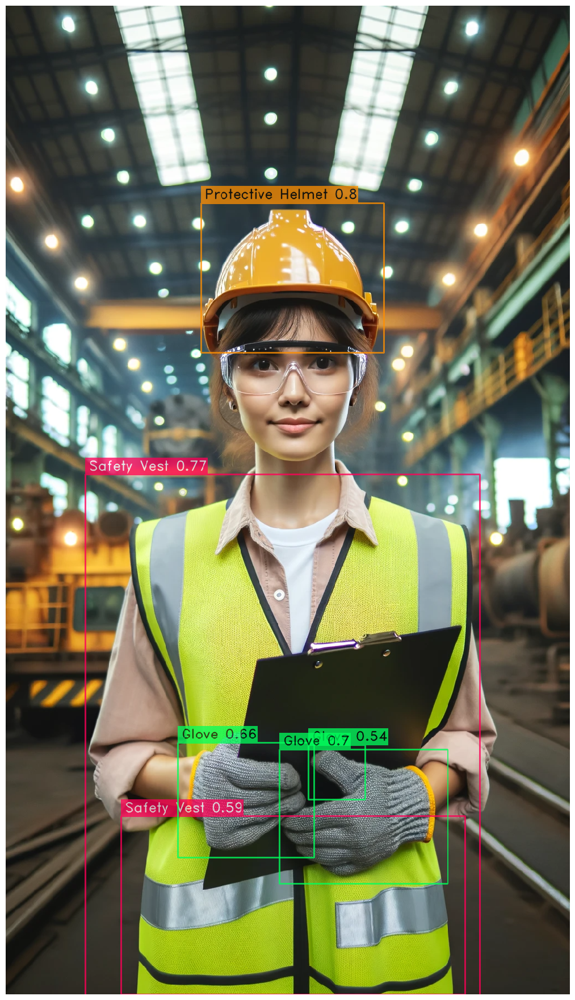

[2023-12-12 01:34:46] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


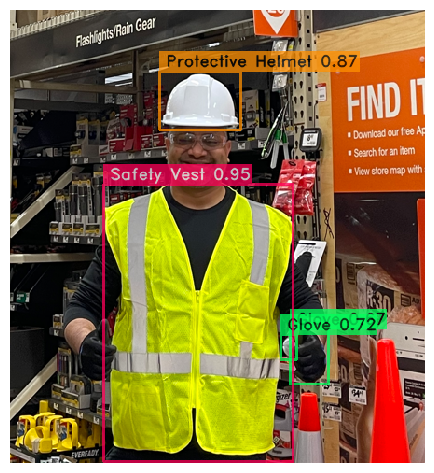

In [13]:
#@title Make predictions

# Make predictions on images
img_urls = ['/content/drive/MyDrive/PPEDetection/PPE_Detection/valid/images/Industrial work1.jpg', '/content/drive/MyDrive/PPEDetection/PPE_Detection/valid/Shas5.png']
for img_url in img_urls:
    best_model.predict(img_url).show()



In [14]:
# Make predictions on a video
device = 'cuda' if torch.cuda.is_available() else 'cpu'
best_model.to(device)
input_video_path = "/content/drive/MyDrive/PPEDetection/PPE_Detection/valid/PPE.mp4"
output_video_path = "/content/drive/MyDrive/PPEDetection/PPE_Detection/valid/PPE_out.mp4"
best_model.predict(input_video_path).save(output_video_path)




Processing Video: 100%|██████████| 135/135 [00:07<00:00, 19.21it/s]


In [15]:
# Compress and display the output video
compressed_path = "/content/drive/MyDrive/PPEDetection/PPE_Detection/valid/PPE.mp4"
os.system(f"ffmpeg -i {output_video_path} -vcodec libx264 {compressed_path}")
mp4 = open(compressed_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=400 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

In [16]:
# Compress and display the output video
compressed_path = "/content/drive/MyDrive/PPEDetection/PPE_Detection/valid/PPE_out.mp4"
os.system(f"ffmpeg -i {output_video_path} -vcodec libx264 {compressed_path}")
mp4 = open(compressed_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=400 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")


### **IV. Modeling Results and Findings**


The above evaluation results show the performance of the object detection model on a test dataset. The metrics show the model performs well and is excellent at detecting PPE items (high recall), but it also incorrectly labels many non-PPE items as PPE (low precision), leading to a lot of false positives. The overall object detection accuracy (mAP) is good, but there is a notable imbalance between precision and recall, as reflected in the low F1 score. Improvements could be made by focusing on reducing false positives to enhance precision.

**PPYoloELoss/loss_cls (0.81317604)**

The classification loss measures how well the model can classify whether an object is present or not. A lower value is better. The value 0.813 indicates moderate performance in classification.

**PPYoloELoss/loss_iou (0.41225618)**

The Intersection Over Union (IOU) loss is a measure of overlap between the ground truth and the predicted bounding boxes. Lower IOU loss indicates better accuracy in locating objects. A value of 0.412 suggests the model is reasonably accurate in this aspect.

**PPYoloELoss/loss_dfl (0.44994822)**

The distribution focal loss, which is related to object localization and size estimation within the bounding boxes. A lower value indicates better performance, and 0.449 is a moderate score.

**PPYoloELoss/loss (1.6753803)**

The total loss, combining the above three losses. It provides a holistic view of the model's performance. The value here suggests room for improvement.

**Precision@0.50 (0.06701880693435669)**

The Precision at a threshold of 0.50 indicates the proportion of true positives (correct detections) out of all positive predictions made by the model. A precision of 0.067 is quite low, indicating that a large number of false positives (incorrect detections) are being made.

**Recall@0.50 (0.9768519997596741)**

The Recall at a threshold of 0.50 measures the proportion of actual positives that were correctly identified. A recall of 0.976 is very high, suggesting the model is successful in identifying most of the relevant objects.

**mAP@0.50 (0.802329957485199)**

The mean Average Precision at a threshold of 0.50 is a balanced metric considering both precision and recall across all categories. A mAP of 0.802 is quite good, indicating strong overall performance in detecting objects with a moderate compromise between precision and recall.

**F1@0.50 (0.12173935025930405)**

The F1 Score at a threshold of 0.50 is the harmonic mean of precision and recall. A low F1 score of 0.121 suggests that the model's precision is much lower than its recall, indicating a significant number of false positives.


